<a href="https://colab.research.google.com/github/Zarak00/Projects/blob/main/Political_or_NotPolitical/Political_or_NotPolitical.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark.ml import Pipeline
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover, CountVectorizer
from pyspark.ml.feature import StringIndexer
from pyspark.ml.classification import LogisticRegression, NaiveBayes
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.sql import SparkSession
import matplotlib.pyplot as plt
import seaborn as sns

### Loading and Displaying Data from CSV File

In [ ]:
# Load data from CSV file
df = spark.read.format("csv") \
        .option("inferSchema", False) \
        .option("header", True) \
        .option("sep", ",") \
        .load("/FileStore/tables/facebook_ads_final.csv")

# Display the data
display(df)

id,political,not_political,title,message,created_at,updated_at,lang,impressions,political_probability,suppressed,targets,advertiser,entities,page,lower_page,paid_for_by,targetedness,listbuilding_fundraising_proba
hyperfeed_story_id_5c9baa3ee0ec08073500042,0,0,League of Conservation Voters,"BREAKING: Trump’s Department of the Interior plans to remove Endangered Species Act protections for gray wolves. Without these safeguards, gray wolf populations could decline across the country. We must fight back on this attack on our wildlife.",2019-03-27 16:52:25.625455+00,2019-03-27 16:52:25.625455+00,en-US,1,0.999992183405706,f,[],null,"""[{""""entity"""": """"Endangered Species Act""""","""""entity_type"""": """"Organization""""}","{""""entity"""": """"Trump’s Department of the Interior""""","""""entity_type"""": """"Organization""""}]""",https://www.facebook.com/LCVoters/,https://www.facebook.com/lcvoters/
hyperfeed_story_id_5c9bb2a2413852086735771,0,0,Indivisible Guide,"The Mueller investigation is over. Special Counsel Robert Mueller has delivered his findings to Attorney General Barr, and now Barr must disclose those findings to Congress. Indivisible is demanding that these findings be made public, and we fully support the congressional investigations that are still pending. If you agree, join Indivisible today and urge Congress to release the report. Add your name to the growing list of Americans who are demanding full transparency and accountability in this matter.",2019-03-27 17:28:14.096849+00,2019-03-27 17:28:14.096849+00,en-US,1,0.999997313088443,f,[],null,"""[{""""entity"""": """"Americans""""","""""entity_type"""": """"Group""""}","{""""entity"""": """"Special Counsel""""","""""entity_type"""": """"Person""""}","{""""entity"""": """"Congress""""","""""entity_type"""": """"Organization""""}"
hyperfeed_story_id_5c9bb4fa461731e29426627,0,0,International Rescue Committee,"Zimbabwe is reeling from the impact of Cyclone Idai! Families stranded, hospitals destroyed and landslides threaten to take more lives. Our teams are on the ground providing lifesaving aid, medical care and critical supplies.",2019-03-27 17:38:23.101377+00,2019-03-27 17:38:23.101377+00,en-US,1,0.977569934450884,f,[],null,"""[{""""entity"""": """"Zimbabwe""""","""""entity_type"""": """"Region""""}]""",https://www.facebook.com/InternationalRescueCommittee/,https://www.facebook.com/internationalrescuecommittee/,International Rescue Committee,null
23843380741530360,0,0,Covenant House International,What more can you do in the final hours of 2018? Help us rescue one more kid from the streets.,2018-12-30 20:59:13.879124+00,2018-12-30 20:59:13.879124+00,en-US,1,0.360710895659409,f,"""[{""""target"""": """"Activity on the Facebook Family""""}","{""""target"""": """"Gender""""","""""segment"""": """"women""""}","{""""target"""": """"Age""""","""""segment"""": """"34 and older""""}","{""""target"""": """"MinAge""""","""""segment"""": """"34""""}","{""""target"""": """"Region"""""
hyperfeed_story_id_5c9bb059454851c17741213,0,1,Planned Parenthood,"Say it loud, say it proud: Our rights, our health care, Planned Parenthood health centers are here to stay.",2019-03-27 17:18:29.764002+00,2019-04-11 15:02:58.081112+00,en-US,1,0.999997528786464,f,[],null,"""[{""""entity"""": """"Planned Parenthood""""","""""entity_type"""": """"Organization""""}]""",https://www.facebook.com/PlannedParenthood/,https://www.facebook.com/plannedparenthood/,Planned Parenthood Federation of America,null
hyperfeed_story_id_5c9ba790386328104458863,0,0,FWD.us,"""Florida Senate Bill 168 would damage Florida’s economy and reputation. This harmful legislation would stop local law enforcement from concentrating on real public safety priorities, harm Florida industries, and hurt Florida families.. Sign the petition and ask the legislature to reject SB 168! https://bit.ly/2FfjsDt""",2019-03-27 16:40:53.211965+00,2019-03-27 16:40:53.211965+00,en-US,1,0.999928842180626,f,[],null,"""[{""""entity"""": """"Bill 168

## Cleaning Data
### Selecting Specific Columns in a DataFrame

In [ ]:
df= df.select("message", "political_probability")

### Filtering DataFrame Rows Based on Column Values

In [ ]:
df = df.filter(col('political_probability').cast('float').isNotNull())

### Creating a New Column Based on Column Values

In [ ]:
df = df.withColumn('political_or_not', when(col('political_probability') >= 0.90, 'political').otherwise('unpolitical'))

### Removing Emojis from a DataFrame Column

In [ ]:
emoji_pattern = u'[' \
    u'\U0001F600-\U0001F64F' \
    u'\U0001F300-\U0001F5FF' \
    u'\U0001F680-\U0001F6FF' \
    u'\U0001F1E0-\U0001F1FF' \
    u'\U00002702-\U000027B0' \
    u'\U000024C2-\U0001F251' \
    u']'

df = df.withColumn('message', regexp_replace(col('message'), emoji_pattern, ''))

### Cleaning Text Data in a DataFrame Column

In [ ]:
df = df.withColumn('cleaned_message', regexp_replace('message', '<[^>]+>', ''))
df = df.withColumn('cleaned_message', regexp_replace('cleaned_message', '[^a-zA-Z\s]', ''))

### Converting Column Names to Lowercase

In [ ]:
df = df.select([lower(col).alias(col) for col in df.columns])

### Dropping Rows with Null Values in Specific Columns

In [ ]:
df = df.dropna(subset=["cleaned_message"])
df = df.dropna(subset=["political_or_not"])

### Creating a New Column Based on a Condition in Another Column

In [ ]:
df = df.withColumn("actaul_label", when(df["political_or_not"] == "political", 1).otherwise(0))

In [ ]:
display(df)

message,political_probability,political_or_not,cleaned_message,actaul_label
"breaking: trump’s department of the interior plans to remove endangered species act protections for gray wolves. without these safeguards, gray wolf populations could decline across the country. we must fight back on this attack on our wildlife.",0.999992183405706,political,breaking trumps department of the interior plans to remove endangered species act protections for gray wolves without these safeguards gray wolf populations could decline across the country we must fight back on this attack on our wildlife,1
"the mueller investigation is over. special counsel robert mueller has delivered his findings to attorney general barr, and now barr must disclose those findings to congress. indivisible is demanding that these findings be made public, and we fully support the congressional investigations that are still pending. if you agree, join indivisible today and urge congress to release the report. add your name to the growing list of americans who are demanding full transparency and accountability in this matter.",0.999997313088443,political,the mueller investigation is over special counsel robert mueller has delivered his findings to attorney general barr and now barr must disclose those findings to congress indivisible is demanding that these findings be made public and we fully support the congressional investigations that are still pending if you agree join indivisible today and urge congress to release the report add your name to the growing list of americans who are demanding full transparency and accountability in this matter,1
"zimbabwe is reeling from the impact of cyclone idai! families stranded, hospitals destroyed and landslides threaten to take more lives. our teams are on the ground providing lifesaving aid, medical care and critical supplies.",0.977569934450884,political,zimbabwe is reeling from the impact of cyclone idai families stranded hospitals destroyed and landslides threaten to take more lives our teams are on the ground providing lifesaving aid medical care and critical supplies,1
what more can you do in the final hours of 2018? help us rescue one more kid from the streets.,0.360710895659409,unpolitical,what more can you do in the final hours of help us rescue one more kid from the streets,0
"say it loud, say it proud: our rights, our health care, planned parenthood health centers are here to stay.",0.999997528786464,political,say it loud say it proud our rights our health care planned parenthood health centers are here to stay,1
"""florida senate bill 168 would damage florida’s economy and reputation. this harmful legislation would stop local law enforcement from concentrating on real public safety priorities, harm florida industries, and hurt florida families.. sign the petition and ask the legislature to reject sb 168! https://bit.ly/2ffjsdt""",0.999928842180626,political,florida senate bill would damage floridas economy and reputation this harmful legislation would stop local law enforcement from concentrating on real public safety priorities harm florida industries and hurt florida families sign the petition and ask the legislature to reject sb httpsbitlyffjsdt,1
the women’s building will transform the former bayview correctional facility in west chelsea into a hub for the girls’ and women’s rights movement. this project will provide affordable traditional and shared office spaces to dozens of new york’s leading girls’ and women’s organizations. tell your state legislator that you support the the women's building today!,0.98988178806784,political,the womens building will transform the former bayview correctional facility in west chelsea into a hub for the girls and womens rights movement this project will provide affordable traditional and shared office spaces to dozens of new yorks leading girls and womens organizations tell your state legislator that you support the the womens building today,1
lock them up? just like hilla

### Counting the Number of Rows in a DataFrame

In [ ]:
df.count()

Out[12]: 149837

### Tokenizing a DataFrame Column

In [ ]:
tokenizer = RegexTokenizer(inputCol="cleaned_message", outputCol="regex_message", pattern="\\W")

### Removing Stopwords from a DataFrame Column

In [ ]:
stopwords = ['the', 'and', 'to', 'of', 'a', 'in', 'that', 'it', 'for', 'with', 'on', 'was', 'as', 'at', 'by', 'an', 'be', 'this', 'which', 'or', 'from', 'are', 'were', 'if', 'can', 'they', 'will', 'has', 'but', 'not', 'had', 'their', 'one', 'all', 'have', 'there', 'been', 'so', 'what', 'when', 'who', 'out', 'up', 'its', 'some', 'into', 'no', 'any', 'only', 'my', 'them', 'her', 'me', 'i', 'he', 'she', 'his', 'him', 'we', 'our', 'us']

cut_stopwords = StopWordsRemover(inputCol="regex_message", outputCol="filtered_text").setStopWords(stopwords)

### Vectorizing Text Data

In [ ]:
vectorize = CountVectorizer(inputCol="filtered_text", outputCol="features", vocabSize=5000, minDF=10)

### Building a Pipeline to Process Text Data

In [ ]:
pipeline_model = Pipeline(stages=[tokenizer, cut_stopwords, vectorize]).fit(df)
df_proc = pipeline_model.transform(df)

### Split the Data into Training and Test Sets

In [ ]:
df_train, df_test= df_proc.randomSplit([0.7, 0.3], seed=42)
print(f"There are {df_train.count()} rows in the training set, and {df_test.count()} in the test set")

There are 105216 rows in the training set, and 44621 in the test set


### Train a Logistic Regression Model

In [ ]:
lr = LogisticRegression(featuresCol="features", labelCol="actaul_label")
model = lr.fit(df_train)

### Make Predictions on the Test Set

In [ ]:
df_pred = model.transform(df_test)

### Evaluate Model Performance on the Test Set

In [ ]:
evaluator_acc = MulticlassClassificationEvaluator(labelCol="actaul_label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator_acc.evaluate(df_pred)
print("accuracy score on test data: ", accuracy)

accuracy score on test data:  0.8899621254566236


### Display Predictions for Political Messages

In [ ]:
df_pred_political = df_pred.filter(df_pred['prediction'] == 0)

df_pred_political.select("actaul_label","prediction","cleaned_message").show(10)

+------------+----------+--------------------+
|actaul_label|prediction|     cleaned_message|
+------------+----------+--------------------+
|           0|       0.0|this page is dedi...|
|           0|       0.0|nurses and caregi...|
|           0|       0.0|connect with pnn ...|
|           1|       0.0|virginia lawmaker...|
|           1|       0.0|i loved soccer as...|
|           0|       0.0|the first thing y...|
|           1|       0.0|the story of sb  ...|
|           1|       0.0|when unions are g...|
|           0|       0.0|  of americans wr...|
|           0|       0.0| of americans bel...|
+------------+----------+--------------------+
only showing top 10 rows



### Display Predictions for UnPolitical Messages

In [ ]:
df_pred_unpolitical = df_pred.filter(df_pred['prediction'] == 1)

df_pred_unpolitical.select("actaul_label","prediction","cleaned_message").show(10)

+------------+----------+--------------------+
|actaul_label|prediction|     cleaned_message|
+------------+----------+--------------------+
|           1|       1.0|island interests ...|
|           1|       1.0|to keep up with a...|
|           1|       1.0|were fighting for...|
|           1|       1.0|lifelong republic...|
|           0|       1.0|its crazy that th...|
|           1|       1.0|empowerment schol...|
|           1|       1.0|join us to say ye...|
|           0|       1.0| of la countys wa...|
|           1|       1.0|not to be misseds...|
|           1|       1.0|accessible approa...|
+------------+----------+--------------------+
only showing top 10 rows



### Creating a Confusion Matrix

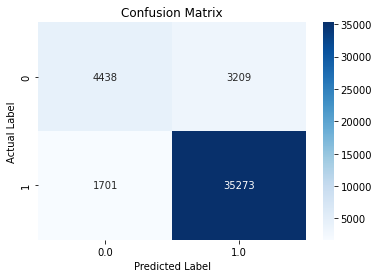

In [ ]:
df_confusion = df_pred.groupBy("actaul_label", "prediction").count()
total_predictions = df_confusion.groupBy().sum("count").collect()[0][0]
df_confusion_percent = df_confusion.withColumn("percent", col("count") / total_predictions * 100)

df_confusion_pd = df_confusion_percent.toPandas()

df_confusion_pd = df_confusion_pd.pivot(index='actaul_label', columns='prediction', values='count')

sns.heatmap(df_confusion_pd, annot=True, cmap='Blues', fmt='g')

plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.show()